# Main code

In [1]:
from fastai.vision import *
from PIL import Image, ImageDraw, ImageFilter, ImageFont

In [2]:
from fastai.callbacks import *
from fastai.vision.gan import *

In [3]:
import os

os.environ["TORCH_HOME"] = "/media/subhaditya/DATA/COSMO/Datasets-Useful"

In [4]:
path = Path("/media/subhaditya/DATA/COSMO/Datasets/deHazer")
path_hr = path / "normal"
path_lr = path / "hazy"

In [5]:
il = ImageList.from_folder(path_hr)

In [6]:
il

ImageList (55 items)
Image (3, 1200, 1600),Image (3, 1200, 1600),Image (3, 1200, 1600),Image (3, 1200, 1600),Image (3, 1200, 1600)
Path: /media/subhaditya/DATA/COSMO/Datasets/deHazer/normal

In [46]:
unet_learner??

Signature:
unet_learner(
    data: fastai.basic_data.DataBunch,
    arch: Callable,
    pretrained: bool = True,
    blur_final: bool = True,
    norm_type: Union[fastai.layers.NormType, NoneType] = <enum 'NormType'>,
    split_on: Union[Callable, Collection[Collection[torch.nn.modules.module.Module]], NoneType] = None,
    blur: bool = False,
    self_attention: bool = False,
    y_range: Union[Tuple[float, float], NoneType] = None,
    last_cross: bool = True,
    bottle: bool = False,
    cut: Union[int, Callable] = None,
    **learn_kwargs: Any,
) -> fastai.basic_train.Learner
Source:   
def unet_learner(data:DataBunch, arch:Callable, pretrained:bool=True, blur_final:bool=True,
                 norm_type:Optional[NormType]=NormType, split_on:Optional[SplitFuncOrIdxList]=None, blur:bool=False,
                 self_attention:bool=False, y_range:Optional[Tuple[float,float]]=None, last_cross:bool=True,
                 bottle:bool=False, cut:Union[int,Callable]=None, **learn_kwargs:An

In [7]:
bs, size = 32, 128
# bs,size = 24,160
# bs,size = 8,256

In [8]:
arch = models.resnet34
src = ImageImageList.from_folder(path_lr).split_by_rand_pct()

In [9]:
def get_data(bs, size):
    data = (
        src.label_from_func(lambda x: path_hr / x.name)
        .transform(get_transforms(max_zoom=2.0), size=size, tfm_y=True)
        .databunch(bs=bs)
        .normalize(imagenet_stats, do_y=True)
    )

    #     data.c = 3
    return data

In [10]:
data_gen = get_data(bs, size)

In [40]:
data_gen

ImageDataBunch;

Train: LabelList (44 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /media/subhaditya/DATA/COSMO/Datasets/deHazer/hazy;

Valid: LabelList (11 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: /media/subhaditya/DATA/COSMO/Datasets/deHazer/hazy;

Test: None

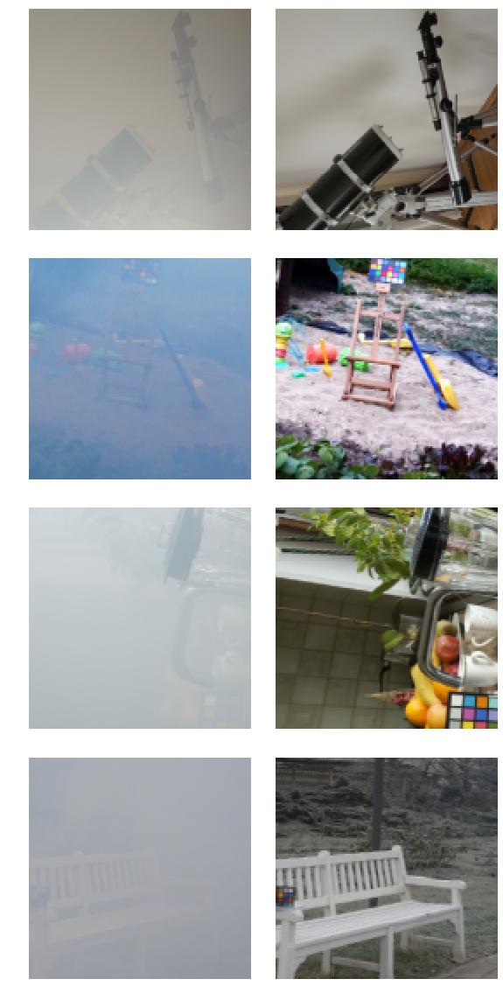

In [11]:
data_gen.show_batch(4)

In [28]:
learn_gen = None
gc.collect()

2918

In [12]:
learn_gen = unet_learner(
    data_gen,
    arch,
    wd=1e-3,
    blur=False,
    norm_type=NormType.Weight,
    self_attention=True,
    #         y_range=y_range,
    loss_func=MSELossFlat(),
)

In [18]:
from fastai.vision.learner import *

In [20]:
fastai.vision.learner.cnn_config??

Object `fastai.vision.learner.cnn_config` not found.


In [17]:
# learn_gen.lr_find()
# learn_gen.recorder.plot()

In [18]:
learn_gen.fit_one_cycle(60, 1e-5)

epoch,train_loss,valid_loss,time
0,2.748707,1.691290,00:06
1,2.725505,1.625740,00:05
2,2.771766,1.573219,00:06
3,2.818240,1.524004,00:06
4,2.850401,1.482832,00:06
5,2.827355,1.444782,00:05
6,2.828578,1.409401,00:06
7,2.821729,1.379923,00:05
8,2.786195,1.352262,00:06
9,2.759548,1.325763,00:06


In [19]:
learn_gen.unfreeze()

In [20]:
learn_gen.fit_one_cycle(200, 1e-5)

epoch,train_loss,valid_loss,time
0,1.372425,1.142695,00:06
1,1.378975,1.141734,00:05
2,1.360525,1.148033,00:05
3,1.340916,1.148574,00:05
4,1.333753,1.147556,00:05
5,1.324932,1.152045,00:05
6,1.321776,1.153030,00:05
7,1.316181,1.150624,00:06
8,1.312537,1.150603,00:05
9,1.306613,1.150251,00:05


In [24]:
learn_gen.save("stage-1")

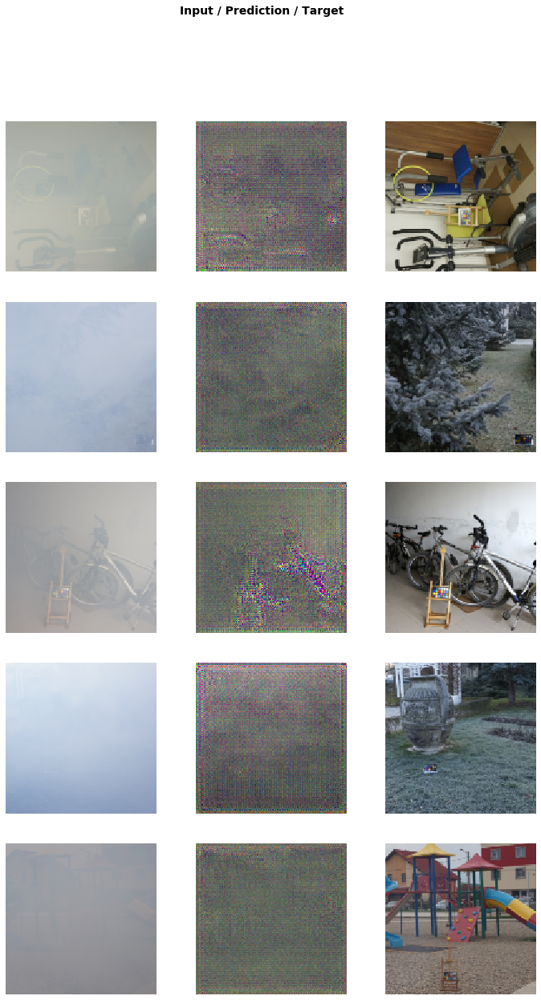

In [22]:
learn_gen.show_results(rows=5)

In [25]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(200, 1e-5)

epoch,train_loss,valid_loss,time
0,0.907193,0.804421,00:06
1,0.836854,0.803812,00:06
2,0.880884,0.804375,00:06
3,0.892365,0.804199,00:05
4,0.906322,0.804430,00:05
5,0.907458,0.804394,00:05
6,0.901781,0.804253,00:05
7,0.892581,0.804174,00:05
8,0.892826,0.803745,00:05
9,0.885137,0.803999,00:05


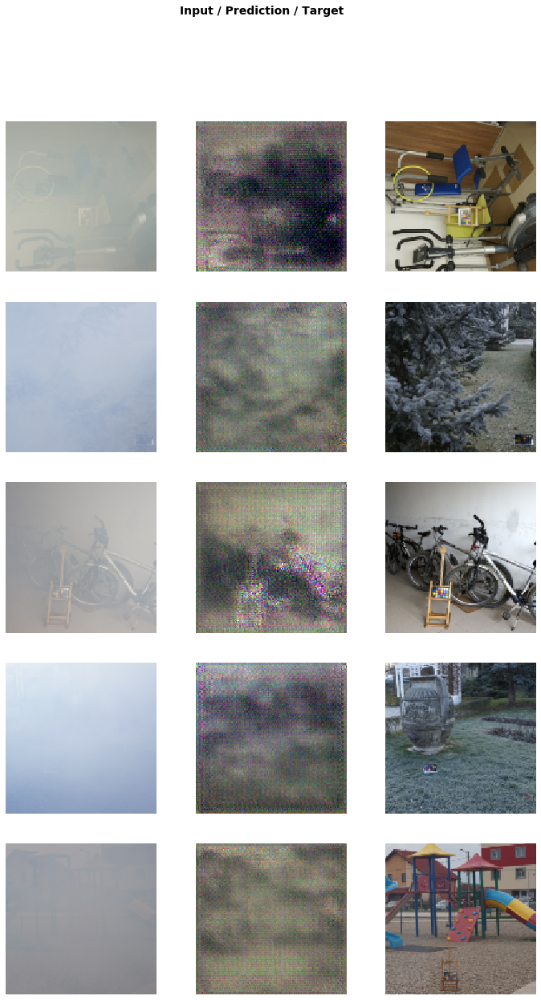

In [26]:
learn_gen.show_results(rows=5)

In [27]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(200, 1e-5)

epoch,train_loss,valid_loss,time
0,0.656900,0.659274,00:06
1,0.620232,0.659144,00:06
2,0.610409,0.662481,00:06
3,0.613554,0.660615,00:06
4,0.603750,0.655483,00:06
5,0.607372,0.654277,00:06
6,0.603860,0.654671,00:06
7,0.591010,0.653495,00:06
8,0.590182,0.654371,00:06
9,0.609029,0.652610,00:06


In [28]:
learn_gen.save("stage-2")

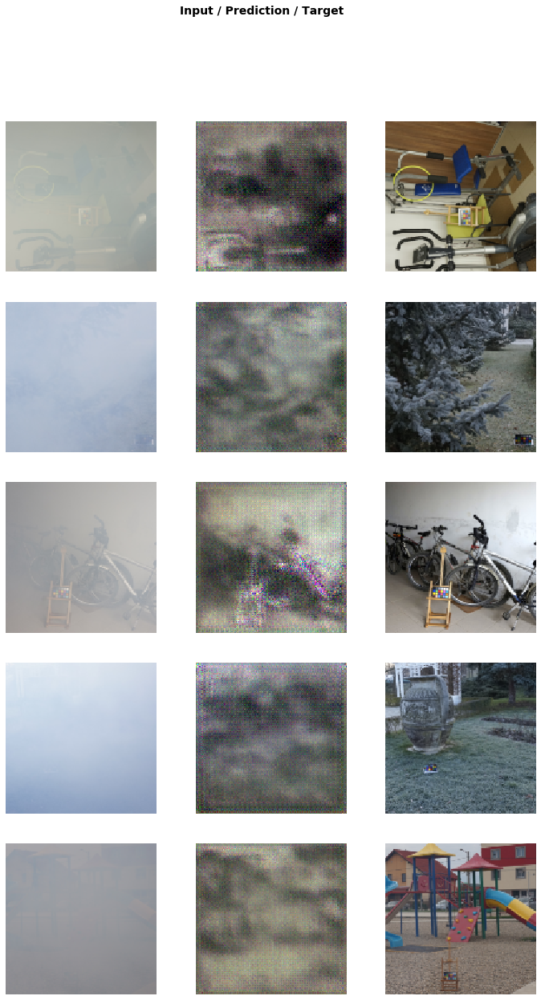

In [29]:
learn_gen.show_results(rows=5)

In [31]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(500, 1e-5)

epoch,train_loss,valid_loss,time
0,0.451796,0.569553,00:05
1,0.465908,0.570026,00:05
2,0.463558,0.571158,00:05
3,0.460094,0.570516,00:05
4,0.457153,0.570878,00:05
5,0.457554,0.570394,00:05
6,0.452981,0.572293,00:05
7,0.459523,0.571254,00:05
8,0.458877,0.571907,00:05
9,0.465469,0.574015,00:05


In [32]:
learn_gen.save("stage-3")

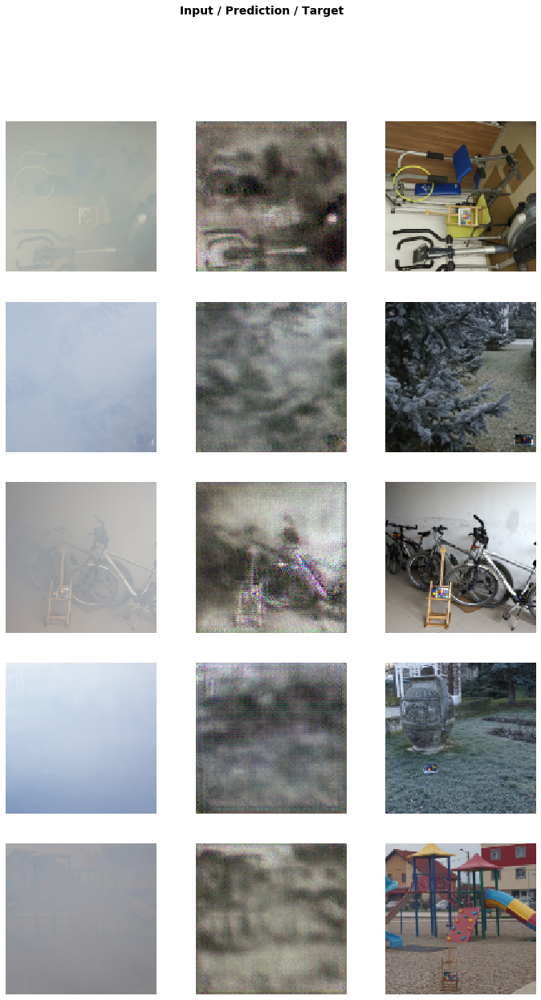

In [33]:
learn_gen.show_results(rows=5)

In [34]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(200, 1e-5)

epoch,train_loss,valid_loss,time
0,0.369546,0.500765,00:06
1,0.352261,0.500418,00:06
2,0.356500,0.499216,00:06
3,0.355136,0.500374,00:06
4,0.352227,0.499025,00:06
5,0.352287,0.498131,00:06
6,0.355612,0.497180,00:06
7,0.357145,0.496130,00:06
8,0.357193,0.496040,00:06
9,0.360289,0.496791,00:06


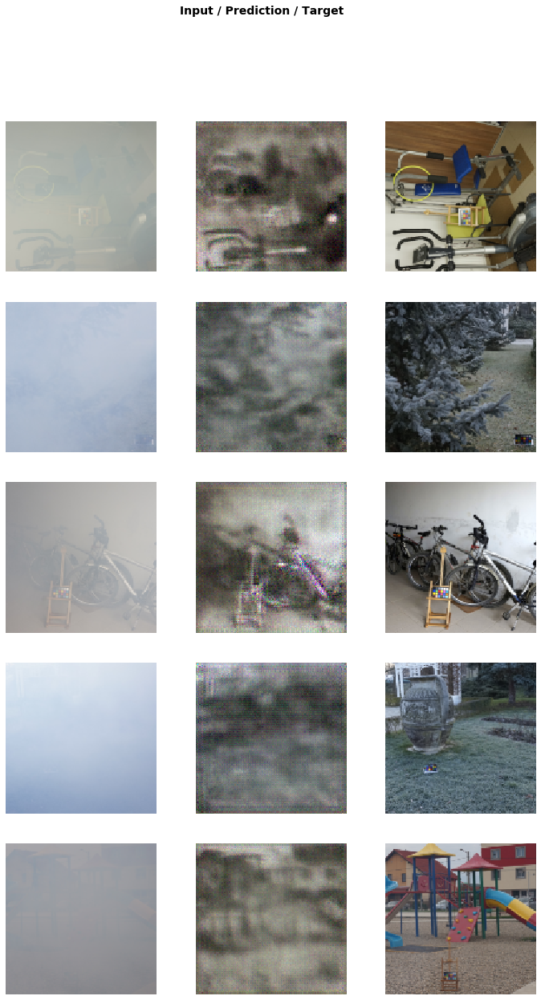

In [35]:
learn_gen.show_results(rows=5)

In [36]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(200, 1e-5)

epoch,train_loss,valid_loss,time
0,0.296644,0.469575,00:06
1,0.322138,0.468283,00:06
2,0.326485,0.469602,00:06
3,0.324031,0.467937,00:06
4,0.318387,0.469040,00:06
5,0.319497,0.468953,00:06
6,0.318820,0.467427,00:06
7,0.318049,0.466646,00:06
8,0.313821,0.469683,00:06
9,0.315719,0.468767,00:05


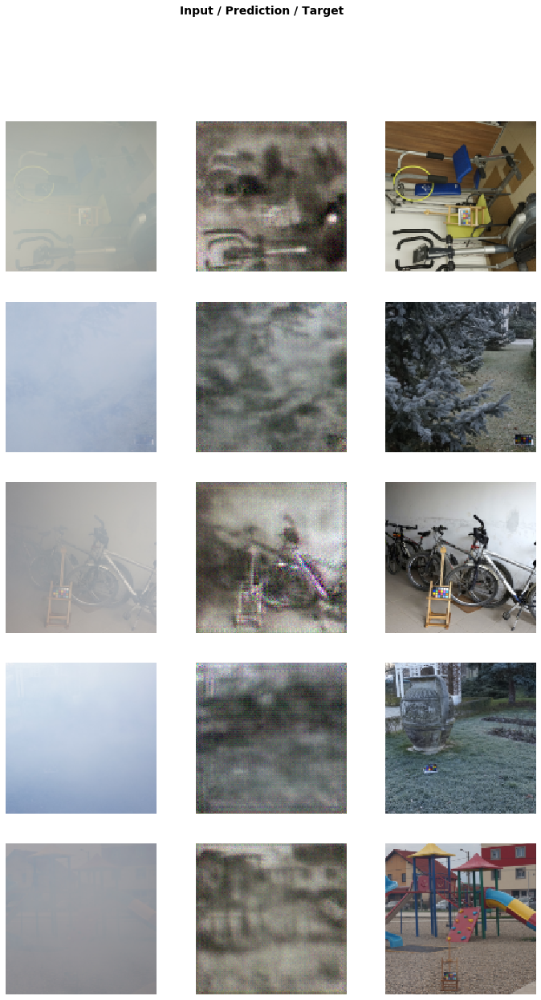

In [37]:
learn_gen.show_results(rows=5)

In [38]:
learn_gen.save("stage-4")

In [39]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(200, 1e-5)

epoch,train_loss,valid_loss,time
0,0.352856,0.464617,00:06
1,0.330353,0.463732,00:06
2,0.315840,0.464201,00:06
3,0.305085,0.465266,00:06
4,0.301732,0.467699,00:06
5,0.299603,0.466668,00:06
6,0.302391,0.466006,00:06
7,0.306616,0.465572,00:06
8,0.303074,0.465220,00:06
9,0.307807,0.462492,00:06


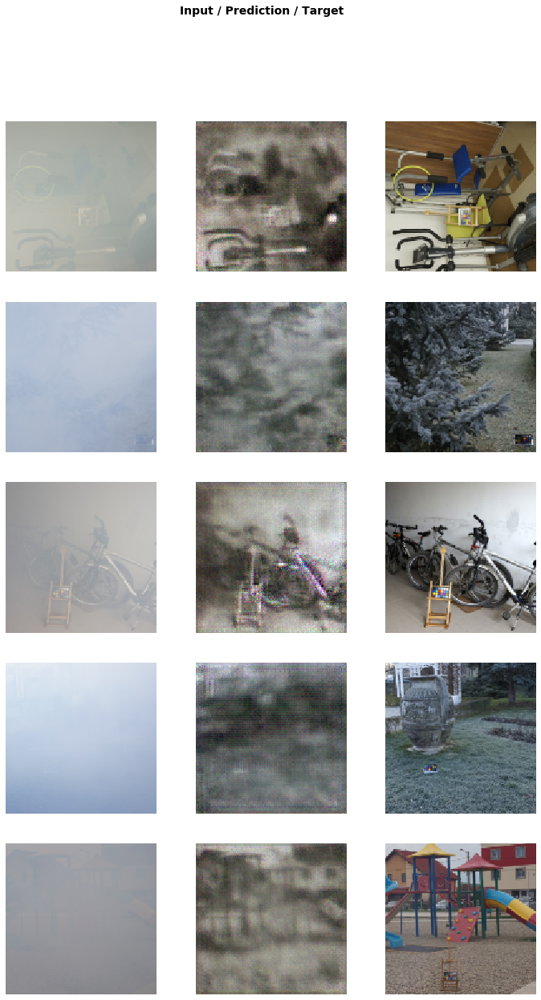

In [40]:
learn_gen.show_results(rows=5)

epoch,train_loss,valid_loss,time
0,0.271387,#na#,00:06
1,0.277295,#na#,00:05
2,0.282648,#na#,00:04
3,0.286083,#na#,00:04
4,0.286497,#na#,00:04
5,0.276603,#na#,00:04
6,0.279610,#na#,00:04
7,0.275922,#na#,00:04
8,0.274652,#na#,00:04
9,0.274754,#na#,00:04


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


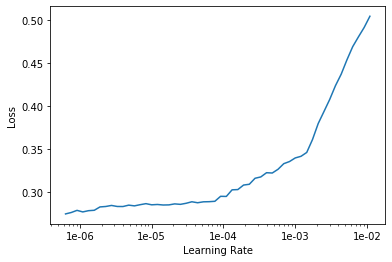

In [41]:
learn_gen.unfreeze()
learn_gen.lr_find()
learn_gen.recorder.plot()

In [42]:
learn_gen.save("stage-5")

## Change data Size

In [45]:
data_gen = get_data(32, 64)

In [46]:
learn_gen = unet_learner(
    data_gen,
    arch,
    wd=1e-3,
    blur=False,
    norm_type=NormType.Weight,
    self_attention=True,
    #         y_range=y_range,
    loss_func=MSELossFlat(),
)

In [50]:
learn_gen.load("stage-5")

Traceback (most recent call last):
  File "/home/subhaditya/anaconda3/lib/python3.7/multiprocessing/queues.py", line 232, in _feed
    close()
  File "/home/subhaditya/anaconda3/lib/python3.7/multiprocessing/connection.py", line 177, in close
    self._close()
  File "/home/subhaditya/anaconda3/lib/python3.7/multiprocessing/connection.py", line 361, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor


Learner(data=ImageDataBunch;

Train: LabelList (44 items)
x: ImageImageList
Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64)
y: ImageList
Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64)
Path: data/hazy;

Valid: LabelList (11 items)
x: ImageImageList
Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64)
y: ImageList
Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64),Image (3, 64, 64)
Path: data/hazy;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, ker

In [51]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(200, 1e-5)

epoch,train_loss,valid_loss,time
0,0.694216,0.643291,00:06
1,0.645895,0.635225,00:06
2,0.612552,0.638144,00:06
3,0.602096,0.629161,00:06
4,0.592038,0.632826,00:06
5,0.589744,0.641027,00:06
6,0.588030,0.645841,00:06
7,0.591655,0.648089,00:06
8,0.592490,0.644808,00:06
9,0.589644,0.642655,00:06


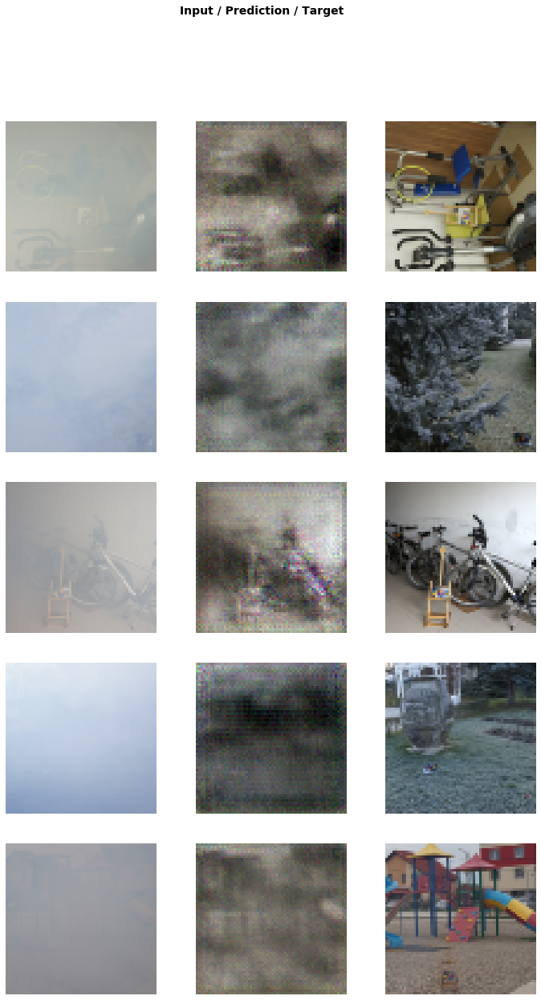

In [52]:
learn_gen.show_results(rows=5)

In [53]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(200, 1e-5)

epoch,train_loss,valid_loss,time
0,0.355958,0.544187,00:05
1,0.343767,0.540847,00:06
2,0.329139,0.542501,00:06
3,0.330284,0.543663,00:06
4,0.339395,0.541958,00:06
5,0.334804,0.544833,00:06
6,0.341560,0.544443,00:06
7,0.349744,0.544799,00:05
8,0.352612,0.544220,00:05
9,0.353678,0.548496,00:06


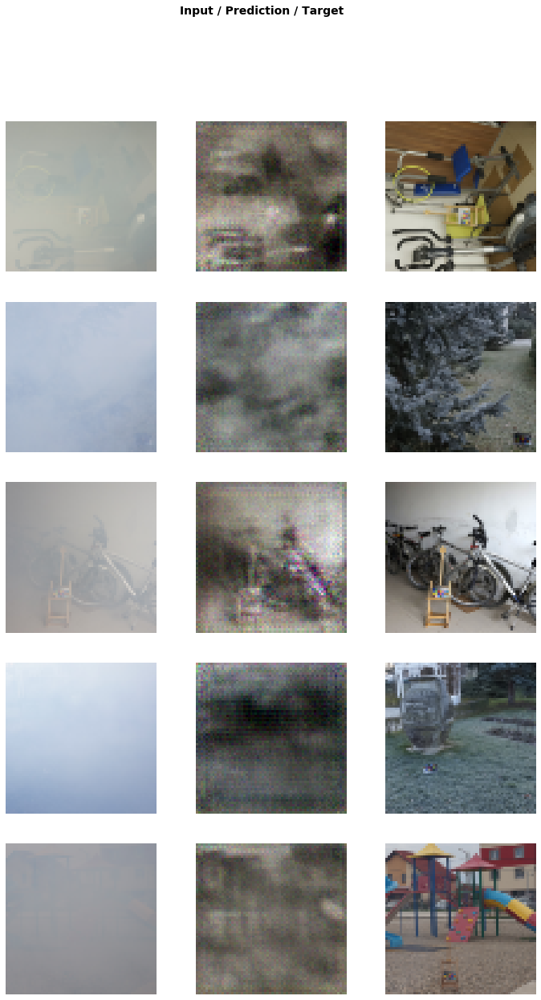

In [54]:
learn_gen.show_results(rows=5)

In [55]:
learn_gen.save("reduced-stage-1")

## Increase size test again

In [56]:
learn_gen = None
gc.collect()

67413

In [57]:
data_gen = get_data(32, 128)

In [58]:
learn_gen = unet_learner(
    data_gen,
    arch,
    wd=1e-3,
    blur=False,
    norm_type=NormType.Weight,
    self_attention=True,
    #         y_range=y_range,
    loss_func=MSELossFlat(),
)

In [59]:
learn_gen.load("reduced-stage-1")

Learner(data=ImageDataBunch;

Train: LabelList (44 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: data/hazy;

Valid: LabelList (11 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: data/hazy;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): BasicBloc

In [60]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(200, 1e-5)

epoch,train_loss,valid_loss,time
0,0.621580,0.630803,00:07
1,0.558357,0.629881,00:06
2,0.526137,0.605390,00:06
3,0.519463,0.597114,00:06
4,0.509201,0.572523,00:06
5,0.511664,0.565378,00:06
6,0.504531,0.554118,00:06
7,0.506382,0.540430,00:06
8,0.502859,0.529171,00:06
9,0.489814,0.520302,00:06


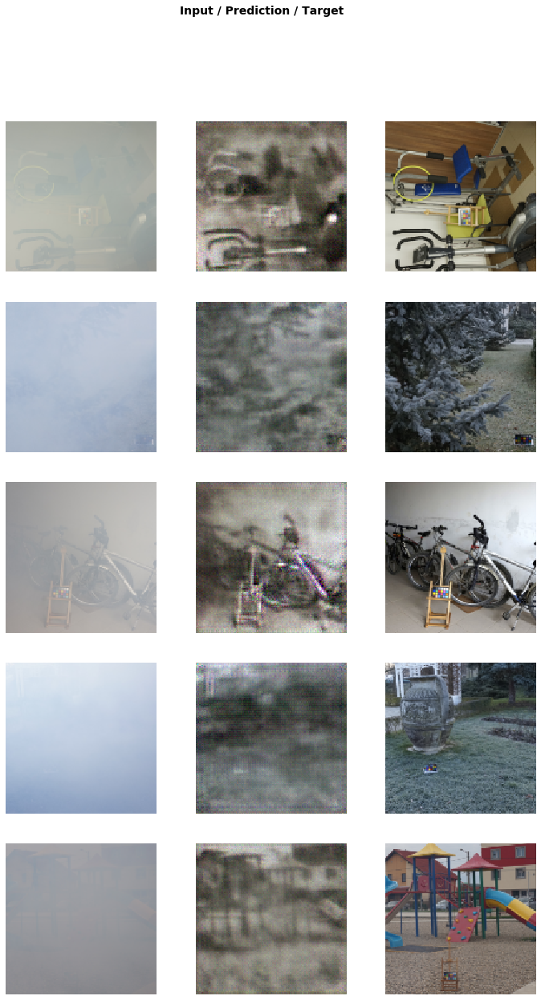

In [61]:
learn_gen.show_results(rows=5)

In [62]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(200, 1e-5)

epoch,train_loss,valid_loss,time
0,0.318617,0.432187,00:06
1,0.288151,0.432692,00:06
2,0.284622,0.434075,00:06
3,0.284967,0.433568,00:06
4,0.278657,0.434003,00:06
5,0.280587,0.433245,00:06
6,0.276720,0.434126,00:06
7,0.275054,0.434672,00:07
8,0.270507,0.436603,00:06
9,0.272461,0.434240,00:06


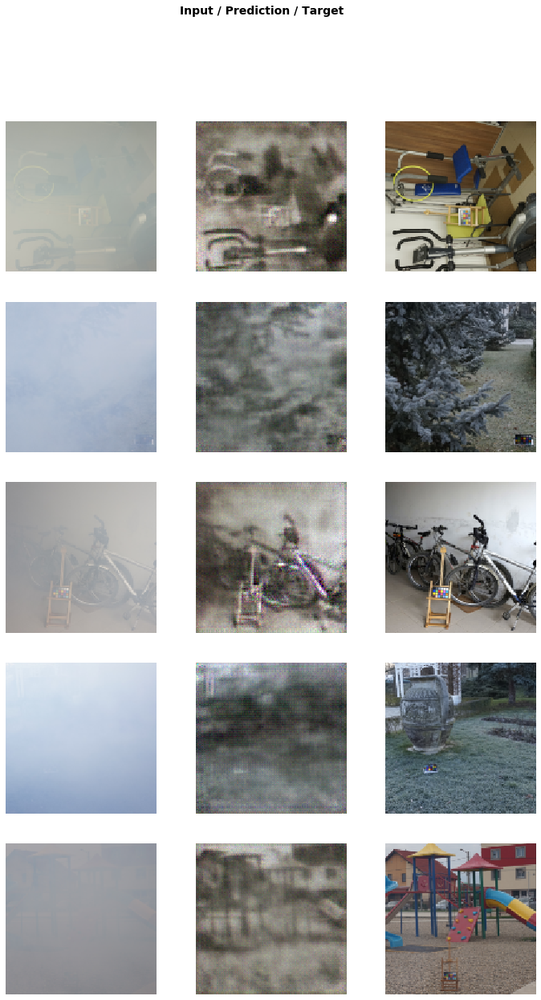

In [63]:
learn_gen.show_results(rows=5)

In [65]:
learn_gen.save("stage-6")

In [67]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(200, 1e-5)

epoch,train_loss,valid_loss,time
0,0.275960,0.439935,00:06
1,0.283067,0.440413,00:06
2,0.272478,0.439693,00:06
3,0.270269,0.441207,00:06
4,0.266676,0.441110,00:06
5,0.261747,0.441871,00:06
6,0.265126,0.440464,00:05
7,0.261578,0.440232,00:06
8,0.259661,0.438384,00:05
9,0.258914,0.438858,00:05


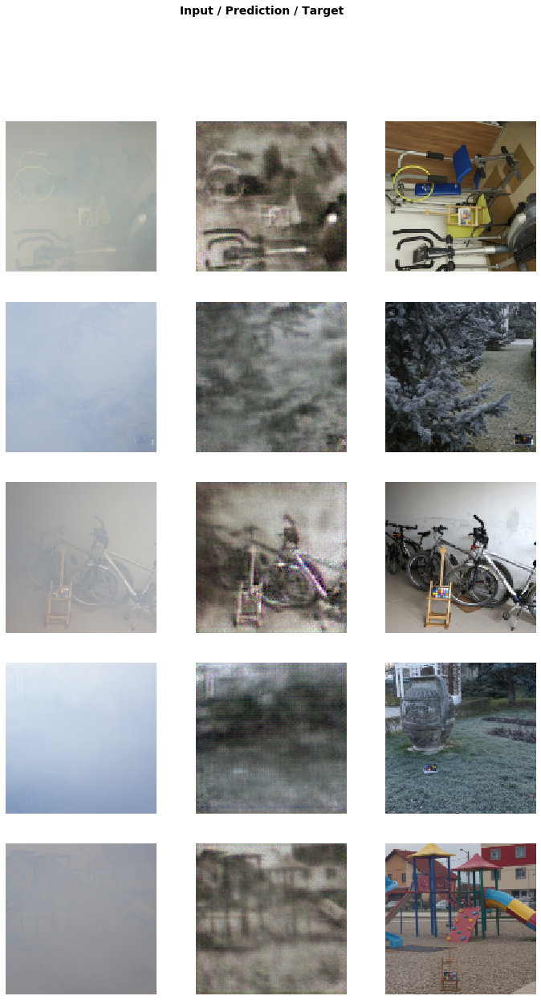

In [68]:
learn_gen.show_results(rows=5)

In [69]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(200, 1e-5)

epoch,train_loss,valid_loss,time
0,0.244342,0.432910,00:06
1,0.250487,0.433370,00:06
2,0.246878,0.434277,00:06
3,0.238674,0.434092,00:06
4,0.239320,0.433019,00:06
5,0.239655,0.435084,00:06
6,0.236832,0.436668,00:06
7,0.237507,0.434436,00:06
8,0.237090,0.435412,00:06
9,0.240288,0.433040,00:06


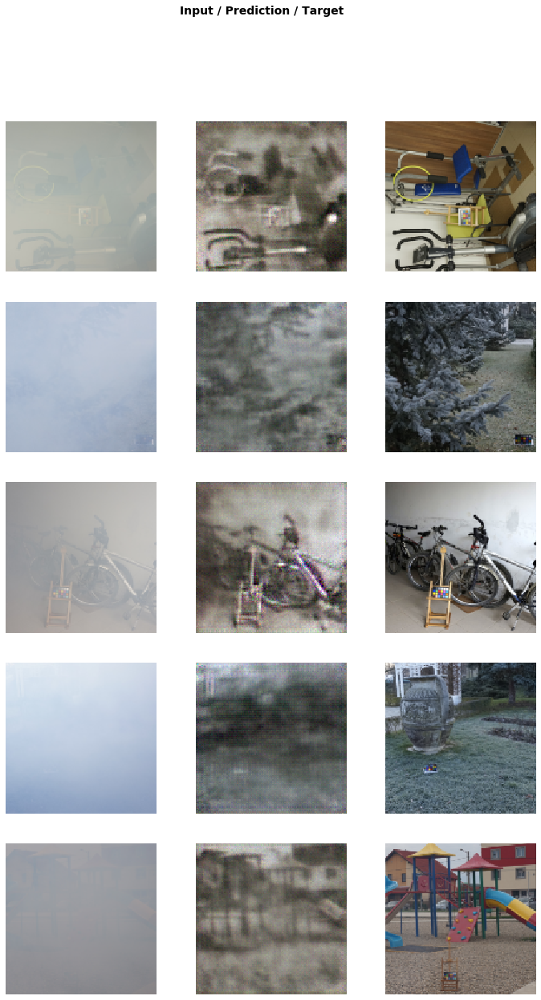

In [70]:
learn_gen.show_results(rows=5)

epoch,train_loss,valid_loss,time
0,0.236583,#na#,00:06
1,0.222565,#na#,00:04
2,0.231661,#na#,00:04
3,0.235469,#na#,00:04
4,0.240338,#na#,00:04
5,0.245875,#na#,00:04
6,0.242579,#na#,00:04
7,0.241588,#na#,00:04
8,0.240310,#na#,00:04
9,0.241039,#na#,00:04


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Traceback (most recent call last):
  File "/home/subhaditya/anaconda3/lib/python3.7/multiprocessing/queues.py", line 232, in _feed
    close()
  File "/home/subhaditya/anaconda3/lib/python3.7/multiprocessing/connection.py", line 177, in close
    self._close()
  File "/home/subhaditya/anaconda3/lib/python3.7/multiprocessing/connection.py", line 361, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor


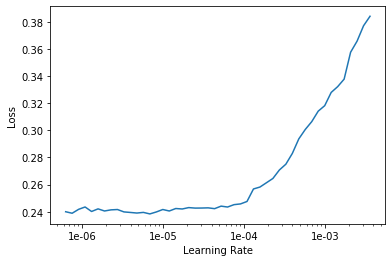

In [71]:
learn_gen.unfreeze()
learn_gen.lr_find()
learn_gen.recorder.plot()

In [72]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(200, 4e-4)

epoch,train_loss,valid_loss,time
0,0.244016,0.464949,00:06
1,0.253151,0.428671,00:06
2,0.259066,0.471827,00:06
3,0.256859,0.521927,00:06
4,0.270356,0.466114,00:06
5,0.265455,0.421923,00:06
6,0.256943,0.439527,00:06
7,0.264442,0.446966,00:06
8,0.273970,0.421898,00:06
9,0.273025,0.432712,00:06


In [73]:
learn_gen.save("stage-7")

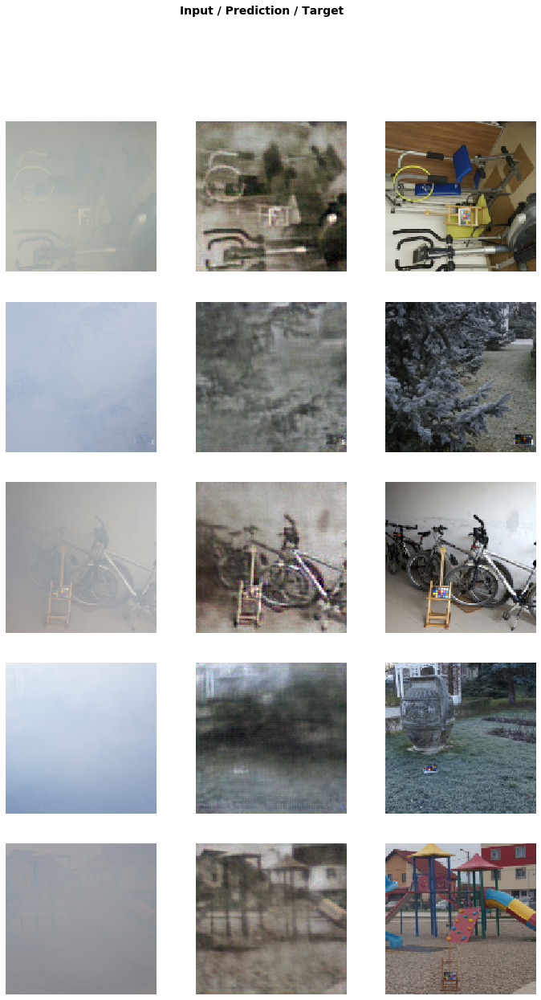

In [74]:
learn_gen.show_results(rows=5)

In [76]:
learn_gen.load("stage-7")

Learner(data=ImageDataBunch;

Train: LabelList (44 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: data/hazy;

Valid: LabelList (11 items)
x: ImageImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
y: ImageList
Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128),Image (3, 128, 128)
Path: data/hazy;

Test: None, model=DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): BasicBloc

In [77]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(200, 4e-4)

epoch,train_loss,valid_loss,time
0,0.204175,0.376764,00:07
1,0.198108,0.378018,00:06
2,0.188297,0.386229,00:06
3,0.185739,0.395524,00:06
4,0.186450,0.411805,00:06
5,0.187106,0.408885,00:06
6,0.189995,0.395157,00:06
7,0.191625,0.383915,00:06
8,0.191565,0.381671,00:06
9,0.191308,0.382304,00:06


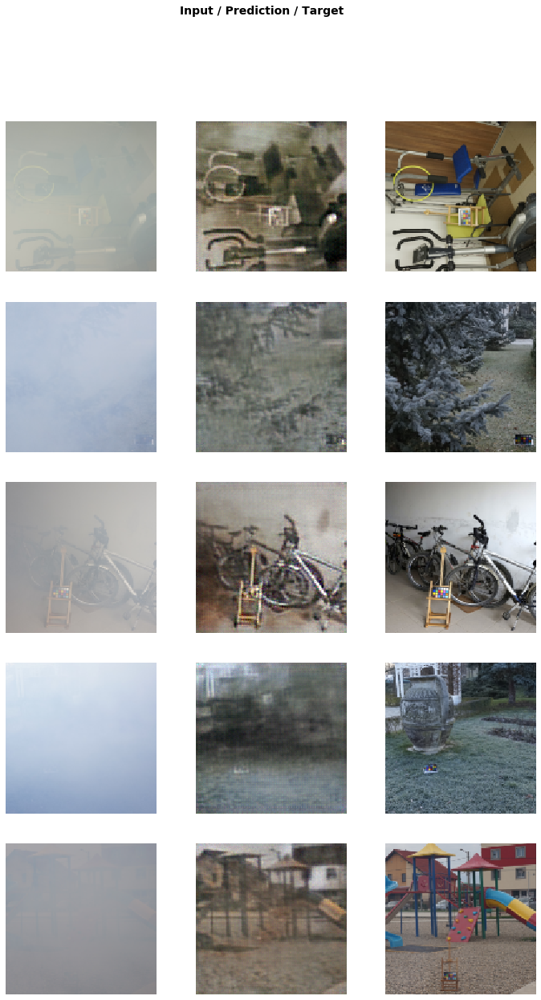

In [79]:
learn_gen.show_results(rows=5)

In [80]:
learn_gen.save("stage-8")

In [81]:
learn_gen.unfreeze()
learn_gen.fit_one_cycle(100, 4e-4)

epoch,train_loss,valid_loss,time
0,0.155583,0.357043,00:06
1,0.160567,0.358342,00:06
2,0.158909,0.361415,00:06
3,0.159925,0.364073,00:06
4,0.160966,0.360138,00:06
5,0.160304,0.355698,00:06
6,0.156700,0.354763,00:06
7,0.156817,0.355632,00:06
8,0.157687,0.354515,00:06
9,0.156526,0.357557,00:05


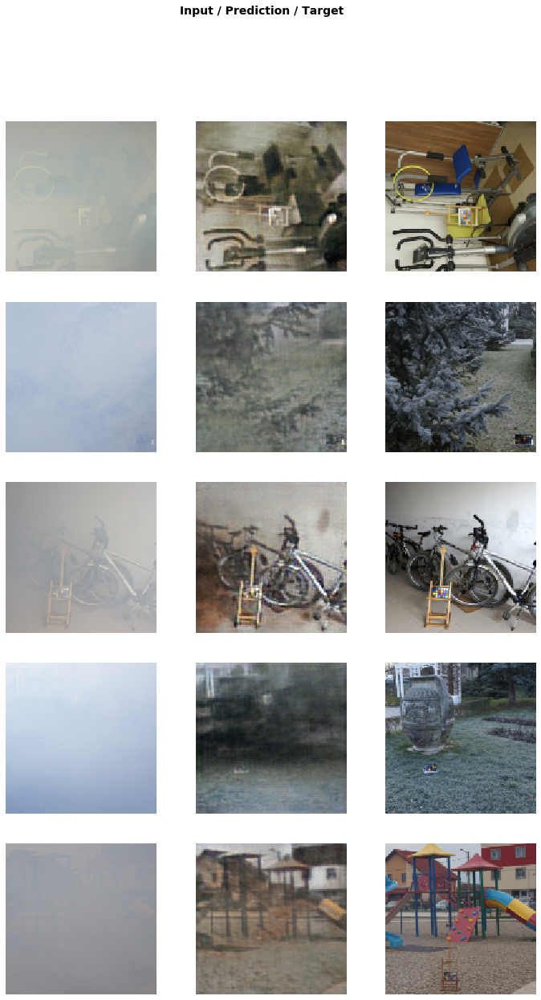

In [82]:
learn_gen.show_results(rows=5)

In [83]:
learn_gen.save("stage-9-fin")

In [ ]:
learn_gen.save("/home/subhaditya/Downloads/gen-pre3")

In [ ]:
learn_gen.export("/home/subhaditya/Downloads/learner3")

In [ ]:
# learn_gen.unfreeze()

In [ ]:
# learn_gen.fit_one_cycle(3, slice(1e-6,1e-3))

In [ ]:
# learn_gen.show_results(rows=4)

# Test

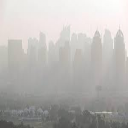

In [91]:
open_image("test1.jpeg").resize((128))

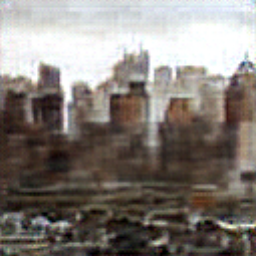

In [102]:
end = learn_gen.predict(open_image("test1.jpeg"))
end[0].resize((256))

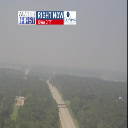

In [92]:
open_image("test2.png").resize((128))

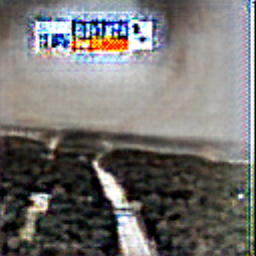

In [101]:
end = learn_gen.predict(open_image("test2.png").resize((128)))
end[0].resize((256))

In [1]:
open_image("test3.jpg").resize((128))

NameError: name 'open_image' is not defined

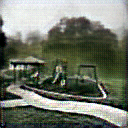

In [ ]:
end = learn_gen.predict(open_image("test4.jpg").resize((128)))
end[0].resize((128))